In [13]:
#ADAPTED SIMULATION FROM CS166 PCWs

import numpy as np

def make_animation(sim, total_frames, steps_per_frame=1, interval=100):
    """
    Create an animation of the simulation.

    Parameters:
    - sim: FoodBacteria
        An instance of the FoodBacteria class representing the simulation.
    - total_frames: int
        Total number of frames for the animation.
    - steps_per_frame: int, optional (default=1)
        Number of simulation steps per animation frame.
    - interval: int, optional (default=100)
        Time interval between frames in milliseconds.

    Returns:
    - HTML
        HTML representation of the animation.
    """
    from matplotlib.animation import FuncAnimation
    from IPython.display import HTML
    from tqdm import tqdm

    def update(frame_number):
        for _ in range(steps_per_frame):
            sim.update()
        progress_bar.update(1)
        return [sim.observe()]

    sim.initialize()
    progress_bar = tqdm(total=total_frames)
    animation = FuncAnimation(
        sim.figure, update, init_func=lambda: [], frames=total_frames, interval=interval)

    output = HTML(animation.to_html5_video())

    sim.figure.clf()

    return output

import matplotlib.pyplot as plt

class FoodBacteria:
    '''
    Implement a Cell automata to model the growth of bacteria and food
    by initializing, displaying and updating each step.
    '''
    def __init__(self, food_growth_rate, food_diffusion_rate, bac_consump_rate,
                 bac_growth_rate, bac_diffusion_rate, size=100, food_max=100, reseeding_p=0.01):
        """
        Initialize the FoodBacteria simulation.

        Parameters:
        - food_growth_rate: float
            Rate of food growth (in the range [0, ∞]).
        - food_diffusion_rate: float
            Rate of food diffusion (in the range [0, 1]).
        - bac_consump_rate: float
            Bacteria consumption rate (in the range [0, ∞]).
        - bac_growth_rate: float
            Bacteria growth rate (in the range [0, 1]).
        - bac_diffusion_rate: float
            Bacteria diffusion rate (in the range [0, 1]).
        - size: int, optional (default=100)
            Size of the grid.
        - food_max: int, optional (default=100)
            Maximum food capacity.
        - reseeding_p: float, optional (default=0.01)
            Reseeding probability (in the range [0, 1]).
        """

        if size <= 0:
            raise ValueError("Size must be positive.")
        self.size = size #100

        if food_max < 0:
            raise ValueError("Food Capacity must be positive.")
        self.food_max = food_max #100

        if reseeding_p < 0 or reseeding_p > 1:
            raise ValueError("Probability must be between 0 and 1.")
        self.reseeding_p = reseeding_p #0.01

        if food_growth_rate < 0:
            raise ValueError("Food growth rate must be positive.")
        self.food_growth_rate = food_growth_rate # [0, oo]

        if food_diffusion_rate < 0 or food_diffusion_rate > 1:
            raise ValueError("Food diffusion rate must be between 0 and 1.")
        self.food_diffusion_rate = food_diffusion_rate # [0, 1]

        if bac_consump_rate < 0:
            raise ValueError("Consumption rate must be positive.")
        self.bac_consump_rate = bac_consump_rate # [0, oo]

        if bac_growth_rate < 0 or bac_growth_rate > 1:
            raise ValueError("Bacteria growth rate must be between 0 and 1.")
        self.bac_growth_rate = bac_growth_rate # [0, 1]

        if bac_diffusion_rate < 0 or bac_diffusion_rate > 1:
            raise ValueError("Food diffusion rate must be between 0 and 1.")
        self.bac_diffusion_rate = bac_diffusion_rate # [0, 1]

        self.step_counter = 0


    def initialize(self):
        """
        Initialize the simulation grid with initial values.
        """
        # set the grid with two blank
        self.config = np.zeros((self.size, self.size, 2))

        for x in range(self.size):
            for y in range(self.size):
                #add 50 bac in the middle of the grid
                if x == y == self.size // 2:
                    #add food randomly between 0 and 100 in the middle
                    initial_food, initial_bacteria = np.random.random()*100, 50

                else:
                    #add food randomly between 0 and 100 in 50% of the other cells
                    initial_food = np.random.random()*100 if np.random.random() < 0.2 else 0
                    initial_bacteria = 0

                self.config[x, y, :] = initial_food, initial_bacteria

        self.figure, self.axes = plt.subplots(1, 3, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1, 1]})

        # Create colorbars
        plot_food = self.axes[0].imshow(
            self.config[:, :, 0], vmin=0, vmax=self.food_max, cmap='viridis', interpolation='None')

        self.colorbar_food = self.figure.colorbar(plot_food, ax=self.axes[0])
        self.colorbar_food.set_label(rotation=270, labelpad=15, label='Food')

        plot_bacteria = self.axes[1].imshow(
            self.config[:, :, 1], vmin=0, vmax=500, cmap='viridis', interpolation='None')

        self.colorbar_bacteria = self.figure.colorbar(plot_bacteria, ax=self.axes[1], label='Bacteria')
        self.colorbar_bacteria.set_label(rotation=270, labelpad=15, label='Food')

        self.nextconfig = np.zeros((self.size, self.size, 2))
        self.history = {'food_mean': [], 'bacteria_mean': []}
        self.step_counter = 0

    def observe(self):
        """
        Observe the current state of the simulation and update the visualization.
        """
        self.axes[0].clear()
        self.axes[1].clear()
        self.axes[2].clear()

        plot_food = self.axes[0].imshow(
            self.config[:, :, 0], vmin=0, vmax=self.food_max, cmap='viridis', interpolation='None')

        plot_bacteria = self.axes[1].imshow(
            self.config[:, :, 1], vmin=0, vmax=100, cmap='viridis', interpolation='None')

        self.axes[2].plot(self.history['food_mean'], label='Food')
        self.axes[2].set_ylim(0, 100)  # Adjust the x-axis limits as needed

        plot_history = self.axes[2].plot(self.history['bacteria_mean'], label='Bacteria', )

        self.axes[2].set_title("Mean Bacteria and Food over time")
        self.axes[2].legend()

        # Set aspect ratio to 'equal'
        self.axes[2].set_aspect('auto')

        # Update colorbar properties
        self.colorbar_food.mappable.set_clim(0, self.food_max)
        self.colorbar_bacteria.mappable.set_clim(0, 100)

        # Set titles for each subplot
        self.axes[0].set_title(f'Food at step {self.step_counter}')
        self.axes[1].set_title(f'Bacteria at step {self.step_counter}')

    def update(self):
        """
        Update the simulation for one step.
        """
        for x in range(self.size):
            for y in range(self.size):

                # current food and bacteriaa
                f1 = self.config[x, y, 0]
                b1 = self.config[x, y, 1]

                # 1) food growth
                f1 = min(f1*(1 + self.food_growth_rate*(1 - f1/self.food_max)), self.food_max)

                # 2) food reseeding
                f1 += 1 if np.random.random() < self.reseeding_p and f1 < self.food_max else 0

                # 3) food diffusion
                fd = self.food_diffusion_rate * f1 # food lost in the mid cell
                f1 -= fd

                for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    if self.nextconfig[(x + dx) % self.size, (y + dy) % self.size, 0] + fd/4 > self.food_max:
                        self.nextconfig[(x + dx) % self.size, (y + dy) % self.size, 0] = self.food_max

                    else:
                        self.nextconfig[(x + dx) % self.size, (y + dy) % self.size, 0] += fd/4 # food gained in the neighbor cells

                # 4) consumption
                if f1 < self.bac_consump_rate * b1:
                    b1 = f1/self.bac_consump_rate
                    f1 = 0

                else:
                    f1 -= self.bac_consump_rate * b1

                # 5) reproduction
                b1 = b1 * (1 + self.bac_growth_rate)

                # 6) bacteria diffusion
                bd = self.bac_diffusion_rate * b1 # bacteria lost in the mid cell
                b1 -= bd

                for dx, dy in [(1, 0), (0, 1), (-1, 0), (0, -1)]:
                    self.nextconfig[(x + dx) % self.size, (y + dy) % self.size, 1] += bd/4 # bacteria gained in the neighbor cells

                self.nextconfig[x, y, :] += f1, b1

        self.config, self.nextconfig = self.nextconfig, np.zeros((self.size, self.size, 2))

        self.history['food_mean'].append(np.mean(self.config[:, :, 0]))
        self.history['bacteria_mean'].append(np.mean(self.config[:, :, 1]))

        self.step_counter += 1


In [15]:
food_growth_rate = 0.8 # [0, oo]
food_diffusion_rate = 0.1 # [0, 1]
bac_consump_rate = 0.7 # [0, oo]
bac_growth_rate = 0.4 # [0, 1]
bac_diffusion_rate = 0.4 # [0, 1]

sim = FoodBacteria(food_growth_rate, food_diffusion_rate, bac_consump_rate,
                 bac_growth_rate, bac_diffusion_rate, size=100, food_max=100, reseeding_p=0.01)

make_animation(sim, total_frames=300, steps_per_frame=10)



  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 1/300 [00:01<08:03,  1.62s/it]

  1%|          | 2/300 [00:03<09:46,  1.97s/it]

  1%|          | 3/300 [2:02:15<201:43:39, 2445.18s/it]


  1%|▏         | 4/300 [00:08<11:22,  2.30s/it]

  2%|▏         | 5/300 [00:10<10:33,  2.15s/it]

  2%|▏         | 6/300 [00:12<10:02,  2.05s/it]

  2%|▏         | 7/300 [00:14<09:47,  2.00s/it]

  3%|▎         | 8/300 [00:16<10:16,  2.11s/it]

  3%|▎         | 9/300 [00:19<10:53,  2.24s/it]

  3%|▎         | 10/300 [00:21<10:18,  2.13s/it]

  4%|▎         | 11/300 [00:23<09:51,  2.05s/it]

  4%|▍         | 12/300 [00:25<09:39,  2.01s/it]

  4%|▍         | 13/300 [00:27<09:34,  2.00s/it]

  5%|▍         | 14/300 [00:29<09:54,  2.08s/it]

  5%|▌         | 15/300 [00:31<10:32,  2.22s/it]

  5%|▌         | 16/300 [00:33<10:00,  2.11s/it]

  6%|▌         | 17/300 [00:35<09:41,  2.06s/it]

  6%|▌         | 18/300 [00:37<09:24,  2.00s/it]

  6%|▋         | 19/300 [00:39<09:11,  1.96s/it]

  7%|▋ 

<Figure size 1500x500 with 0 Axes>

In [ ]:
# EMPIRICAL ANALYSIS

from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

food_growth_rate = 0.8 # [0, oo]
food_diffusion_rate = 0.1 # [0, 1]
bac_consump_rate = 0.7 # [0, oo]
bac_growth_rate = 0.4 # [0, 1]
bac_diffusion_rate = 0.4 # [0, 1]


trials = 1000
steps = 1000

food_amount = {'food_growth':[],
               'food_diffusion':[],
               'consumption_rate':[],
               'bacteria_growth':[],
               'bacteria_diffusion':[]}

bacteria_amount = {'food_growth':[],
                   'food_diffusion':[],
                   'consumption_rate':[],
                   'bacteria_growth':[],
                   'bacteria_diffusion':[]}


parameter_values = np.linspace(0, 1, 20)

100%|██████████| 1000/1000 [02:33<00:00,  6.52it/s]


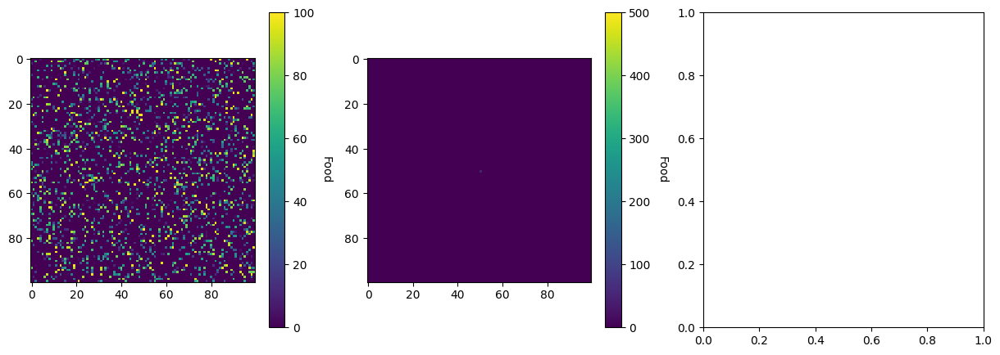

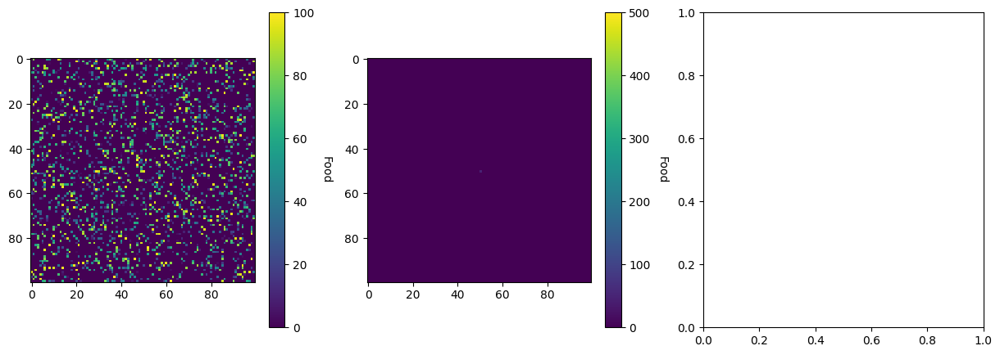

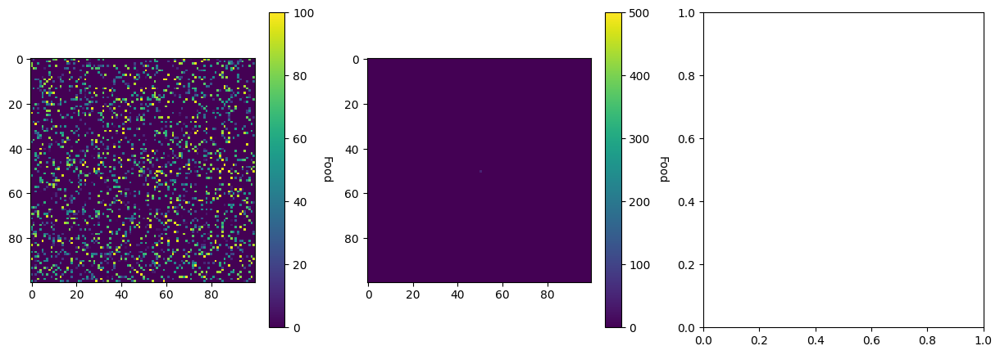

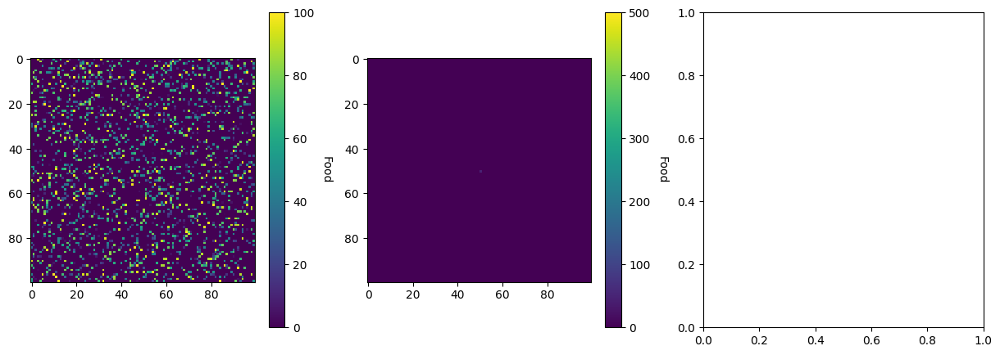

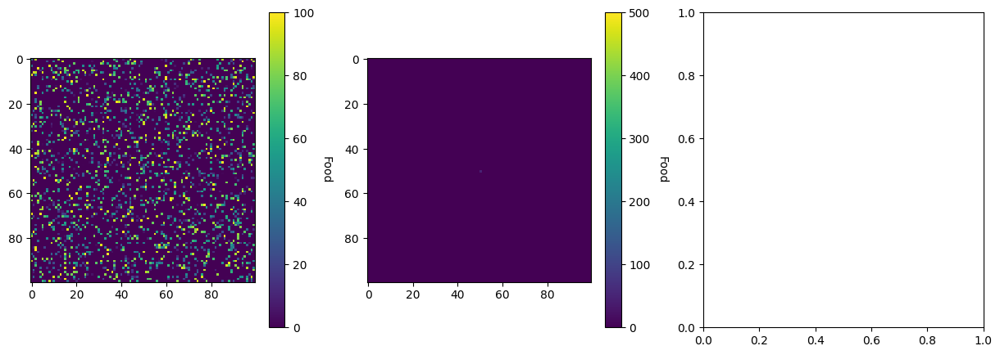

...

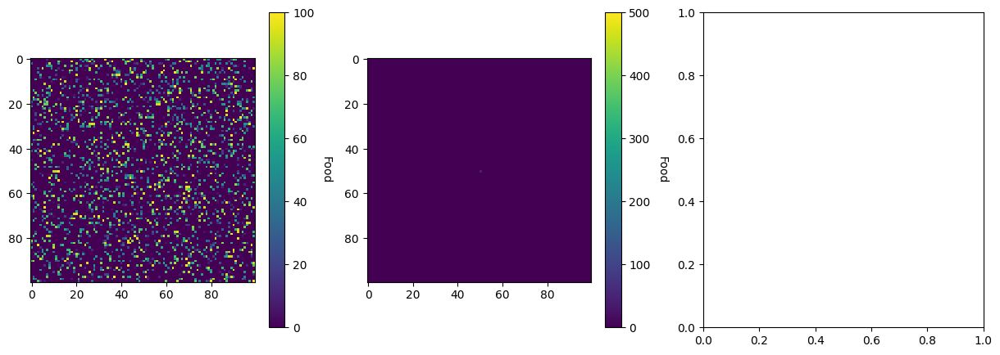

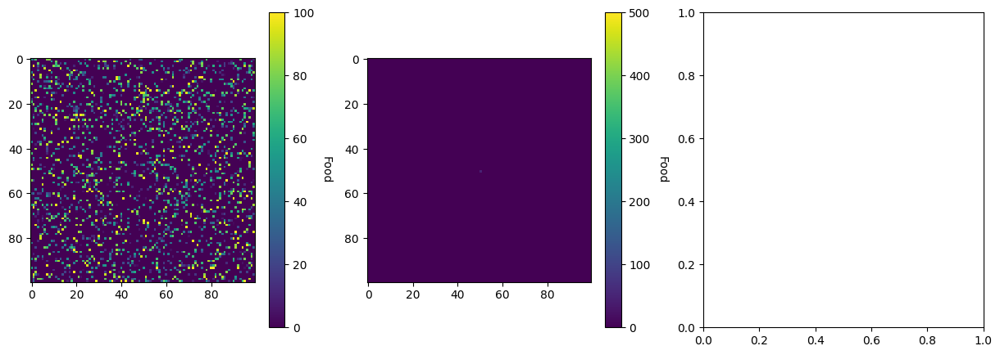

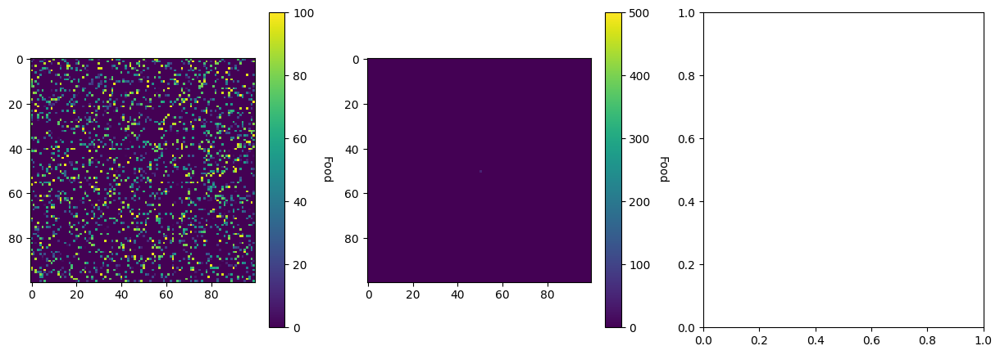

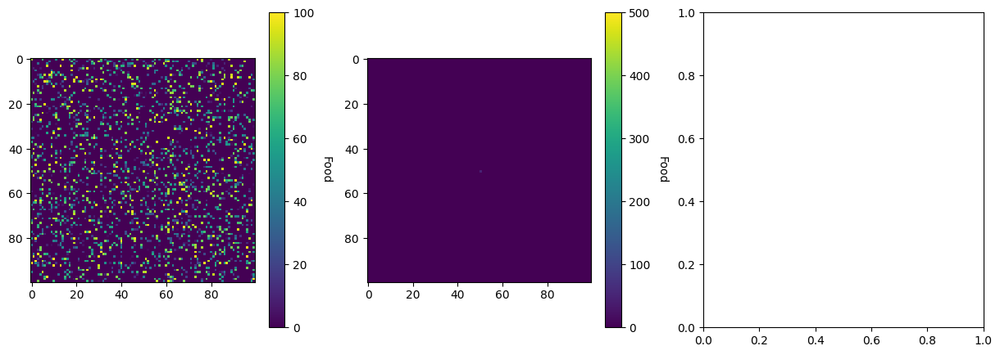

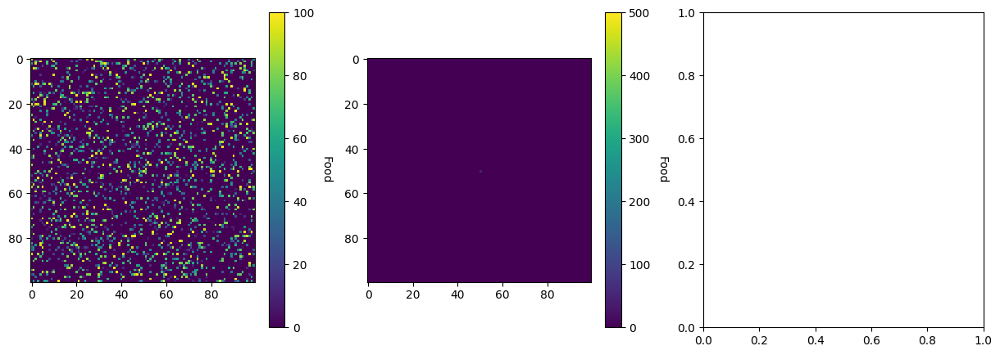

In [17]:
for p in parameter_values:
  # FOOD GROWTH
  sim = FoodBacteria(p, food_diffusion_rate, bac_consump_rate,
                 bac_growth_rate, bac_diffusion_rate, size=100, food_max=100, reseeding_p=0.01)

  sim.initialize()
  for i in tqdm(range(steps)):
    sim.update()

  food_amount['food_growth'].append(np.mean(sim.history['food_mean'][700:]))
  bacteria_amount['food_growth'].append(np.mean(sim.history['bacteria_mean'][700:]))



100%|██████████| 1000/1000 [02:32<00:00,  6.55it/s]


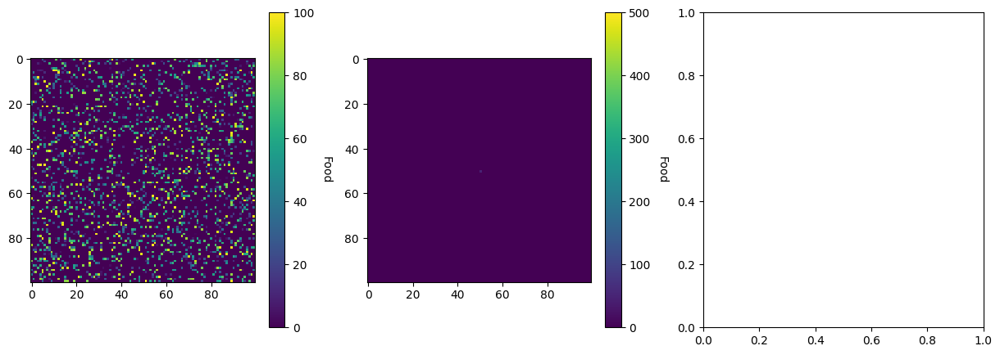

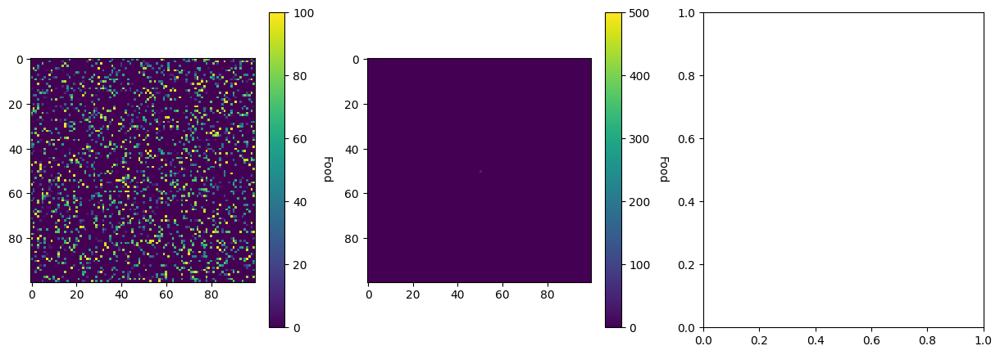

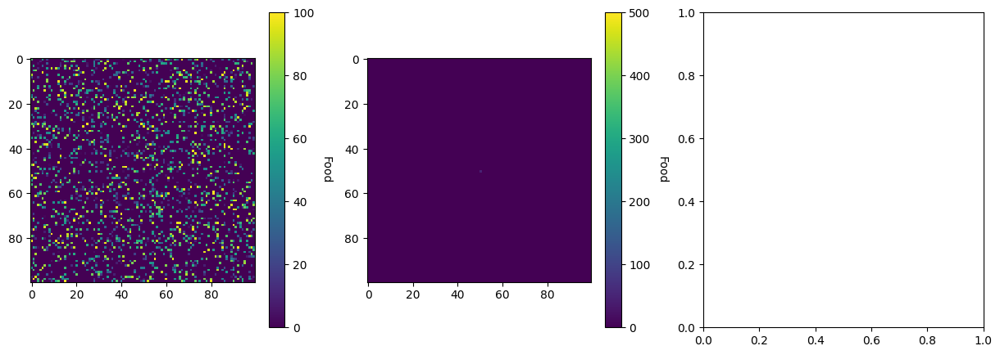

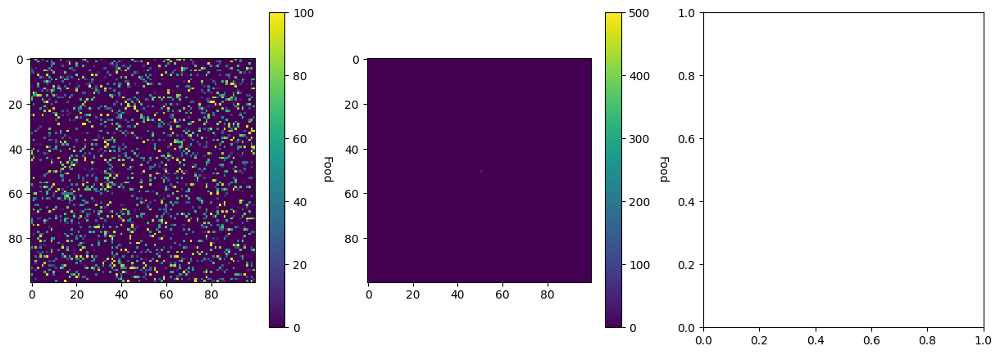

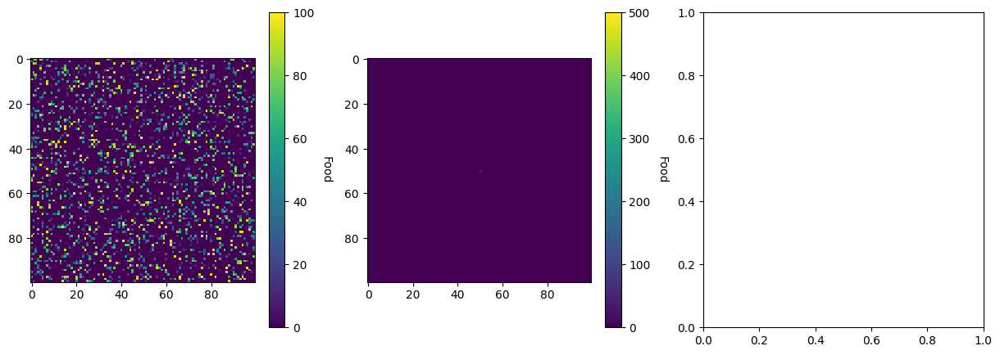

...

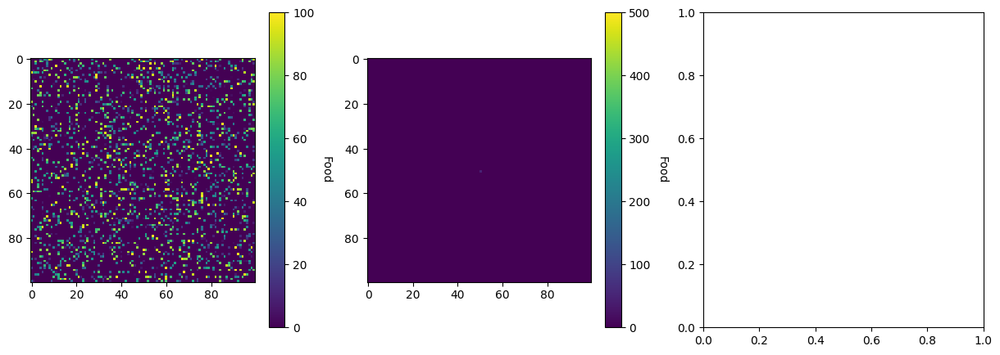

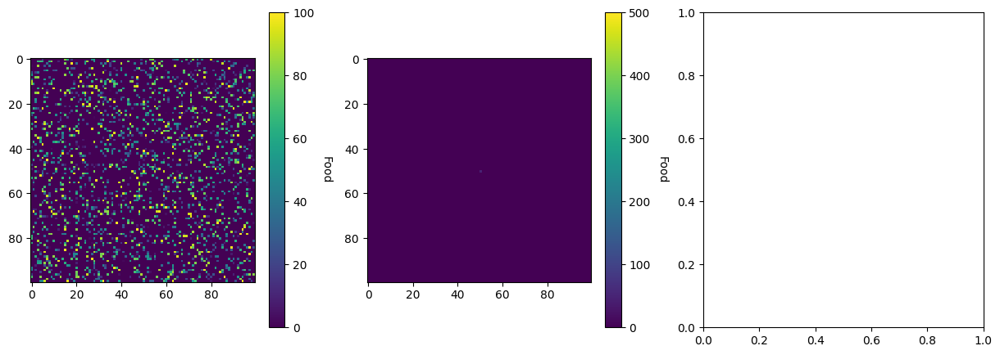

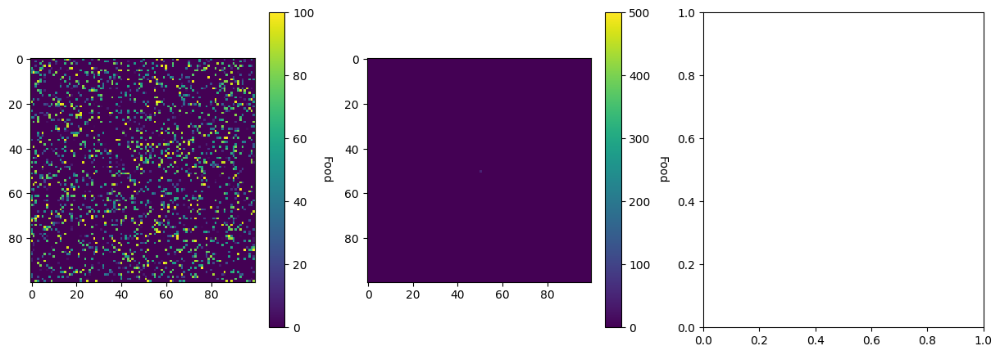

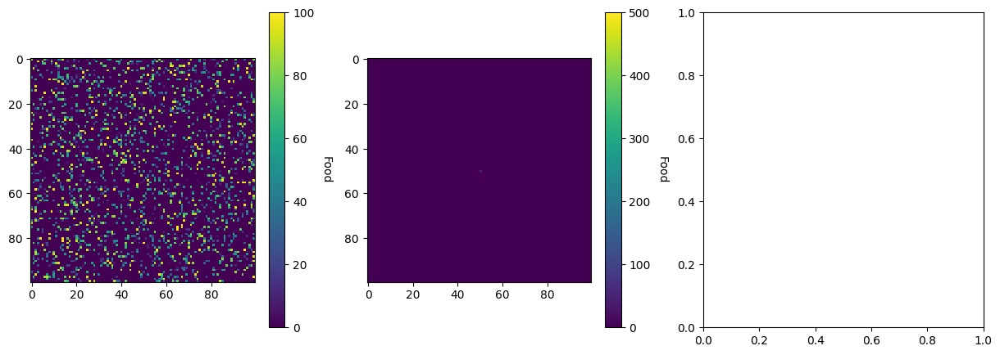

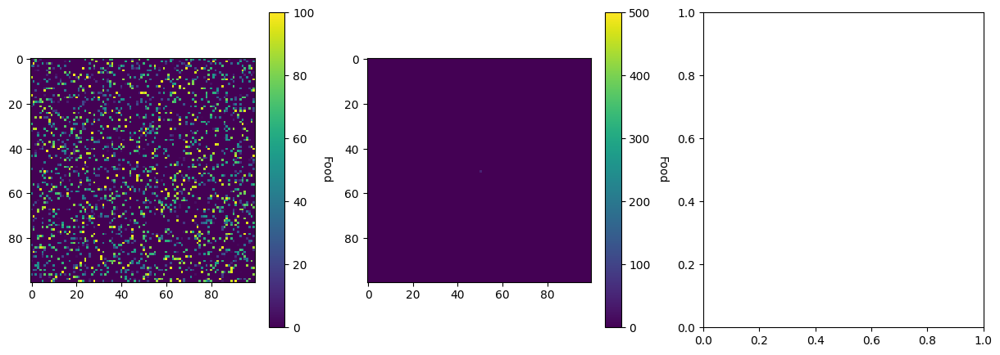

In [26]:
for p in parameter_values:
  # BACTERIA GROWTH
  sim = FoodBacteria(food_growth_rate, food_diffusion_rate, bac_consump_rate,
                 p, bac_diffusion_rate, size=100, food_max=100, reseeding_p=0.01)

  sim.initialize()
  for i in tqdm(range(steps)):
    sim.update()

  food_amount['bacteria_growth'].append(np.mean(sim.history['food_mean'][700:]))
  bacteria_amount['bacteria_growth'].append(np.mean(sim.history['bacteria_mean'][700:]))


100%|██████████| 1000/1000 [02:33<00:00,  6.52it/s]


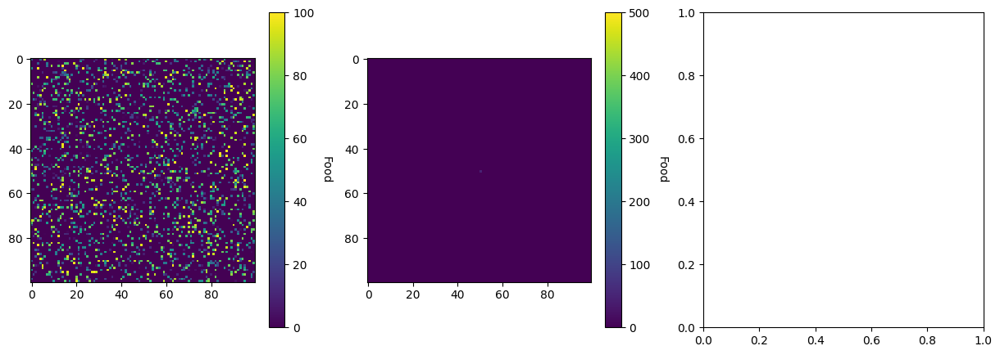

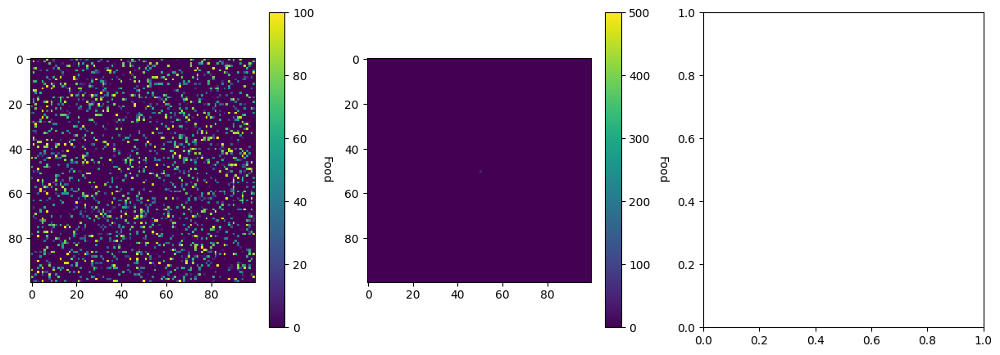

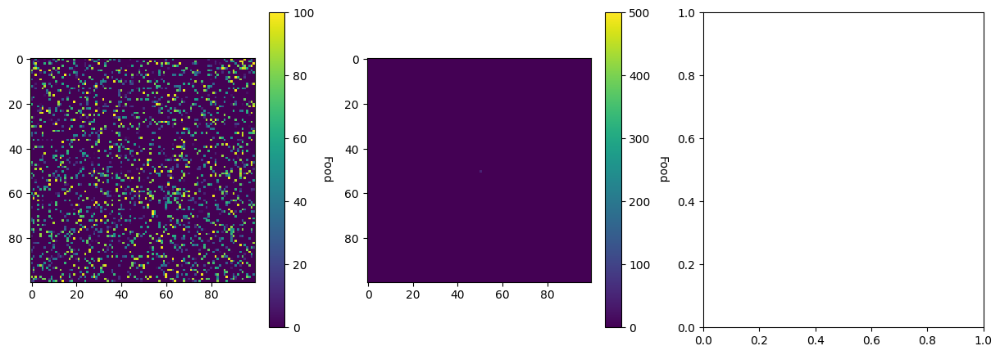

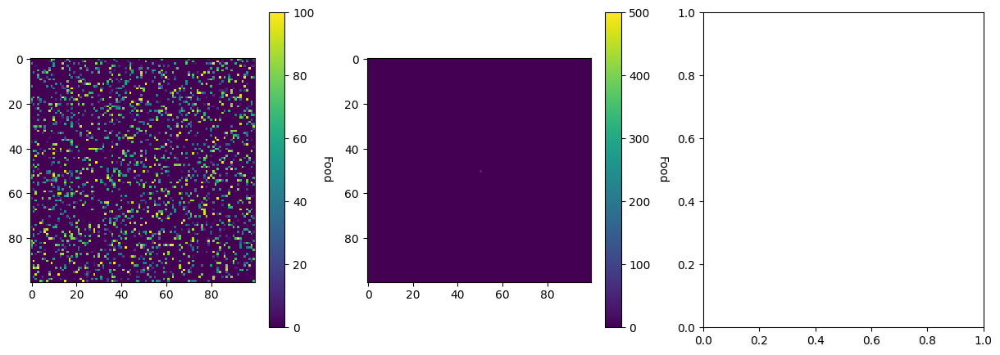

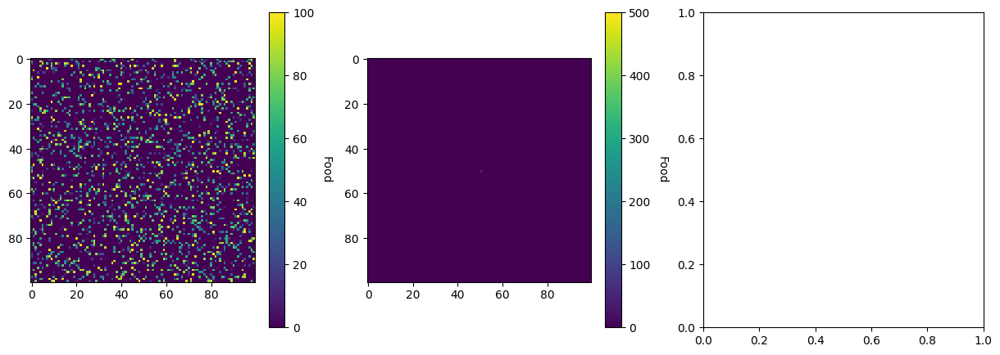

...

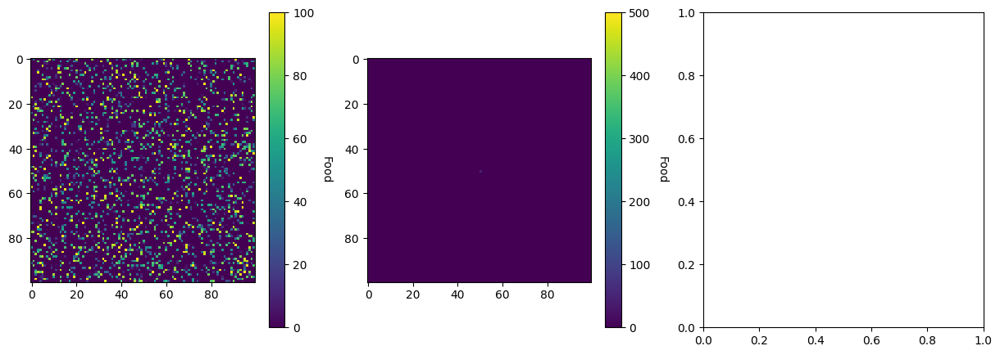

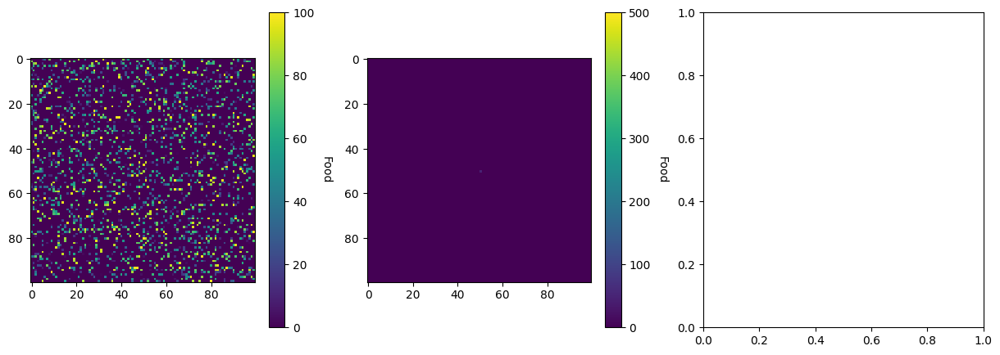

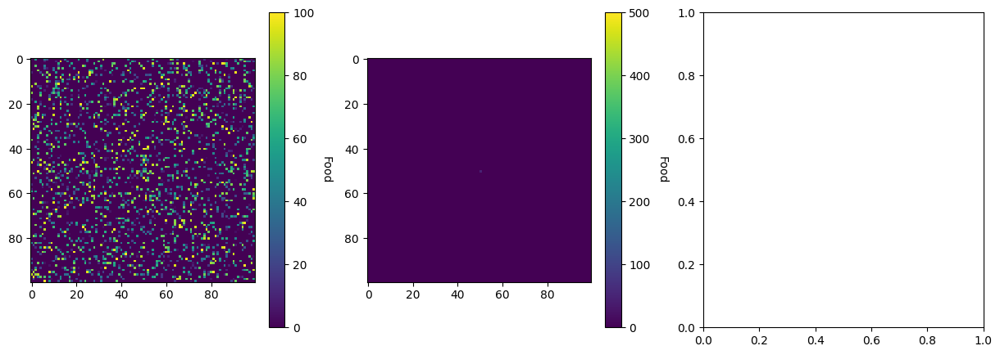

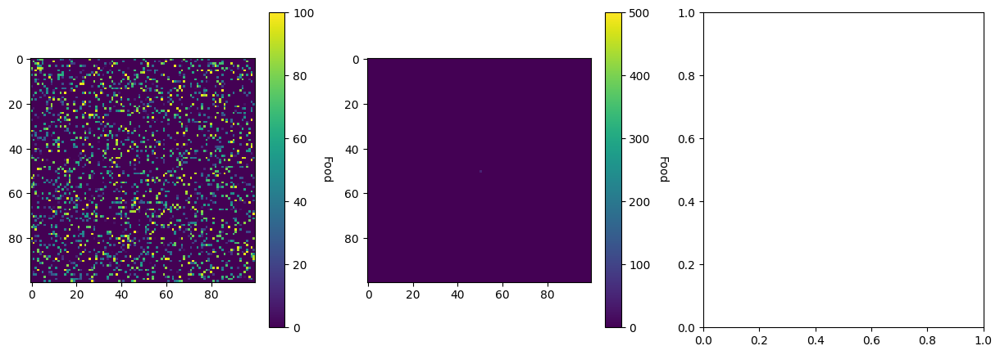

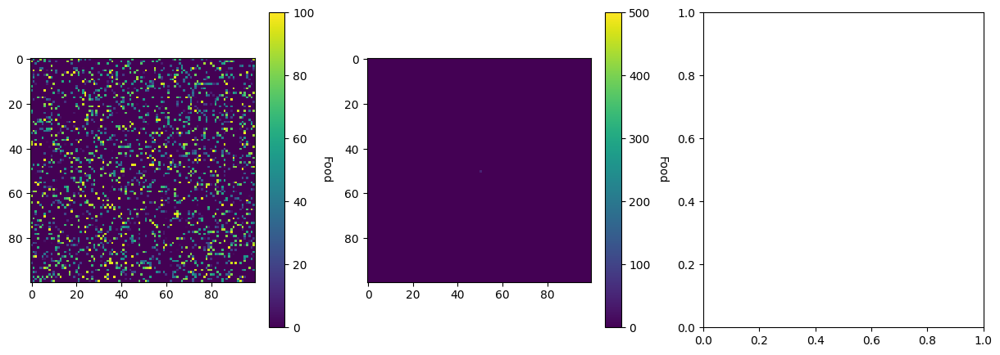

In [30]:
parameter_values = np.linspace(0.1, 1, 20)
for p in parameter_values:
  # CONSUMPTION
  sim = FoodBacteria(food_growth_rate, food_diffusion_rate, p,
                 bac_growth_rate, bac_diffusion_rate, size=100, food_max=100, reseeding_p=0.01)

  sim.initialize()
  for i in tqdm(range(steps)):
    sim.update()

  food_amount['consumption_rate'].append(np.mean(sim.history['food_mean'][700:]))
  bacteria_amount['consumption_rate'].append(np.mean(sim.history['bacteria_mean'][700:]))

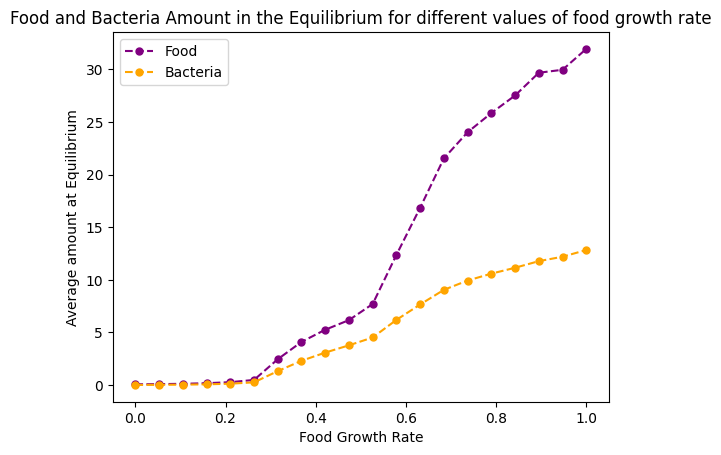

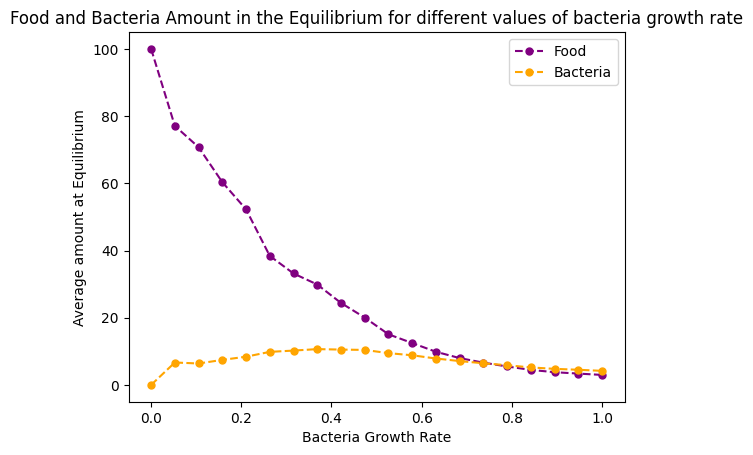

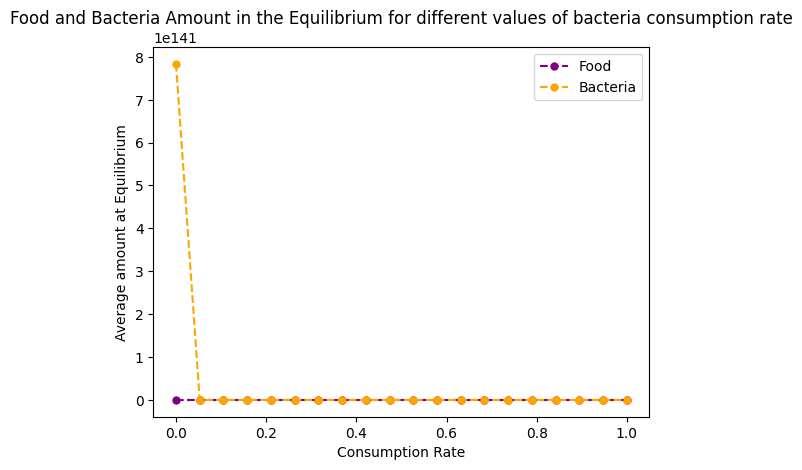

In [29]:
plt.figure()
plt.plot(parameter_values, food_amount['food_growth'], marker='o', linestyle='--', markersize=5, label='Food', color='purple')
plt.plot(parameter_values, bacteria_amount['food_growth'], marker='o', linestyle='--', markersize=5, label='Bacteria', color='orange')
plt.title('Food and Bacteria Amount in the Equilibrium for different values of food growth rate')
plt.xlabel('Food Growth Rate')
plt.ylabel('Average amount at Equilibrium')
plt.legend()
plt.show()

plt.plot(parameter_values, food_amount['bacteria_growth'], marker='o', linestyle='--', markersize=5, label='Food', color='purple')
plt.plot(parameter_values, bacteria_amount['bacteria_growth'], marker='o', linestyle='--', markersize=5, label='Bacteria', color='orange')
plt.title('Food and Bacteria Amount in the Equilibrium for different values of bacteria growth rate')
plt.xlabel('Bacteria Growth Rate')
plt.ylabel('Average amount at Equilibrium')
plt.legend()
plt.show()



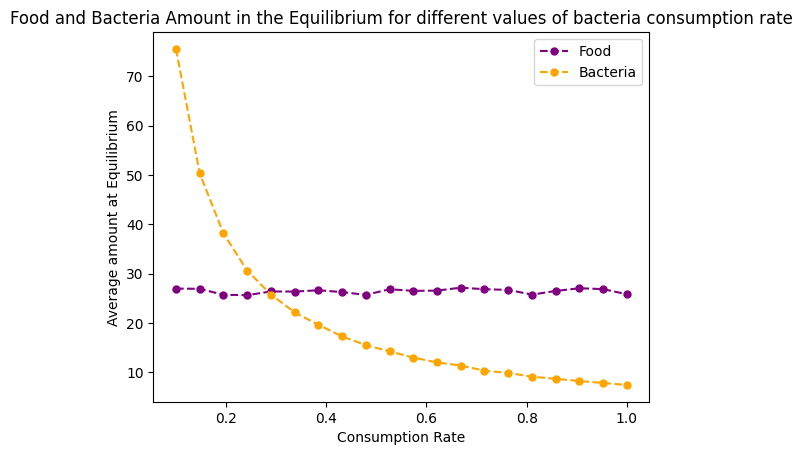

In [32]:
plt.plot(parameter_values, food_amount['consumption_rate'][20:], marker='o', linestyle='--', markersize=5, label='Food', color='purple')
plt.plot(parameter_values, bacteria_amount['consumption_rate'][20:], marker='o', linestyle='--', markersize=5, label='Bacteria', color='orange')
plt.title('Food and Bacteria Amount in the Equilibrium for different values of bacteria consumption rate')
plt.xlabel('Consumption Rate')
plt.ylabel('Average amount at Equilibrium')
plt.legend()
plt.show()

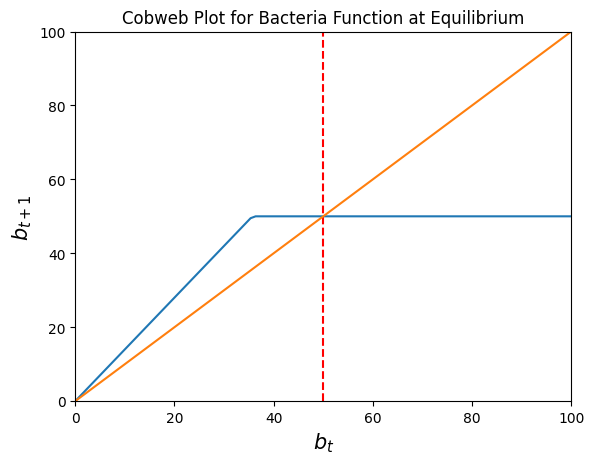

In [11]:
#THEORETICAL ANALYSIS
import numpy as np
import matplotlib.pyplot as plt

def bt_equation(bt, cb, ft, gb):
    return np.minimum(ft/cb, bt)*(1+gb)

# Parameters
gf = 0.8
gb = 0.4
kf = 100
cb = 0.7
# bt = 15
ft = 25

# COBWEB PLOT
ax = np.linspace(0, 100, 100)

plt.axvline(50, color='red', linestyle='--')

plt.ylim(0, 100)
plt.xlim(0, 100)
plt.plot(ax, bt_equation(ax, cb, ft, gb))
plt.plot(ax, ax)
plt.title('Cobweb Plot for Bacteria Function at Equilibrium')
plt.xlabel(r'$b_{t}$', size=15)
plt.ylabel(r'$b_{t+1}$', size=15)
plt.show()

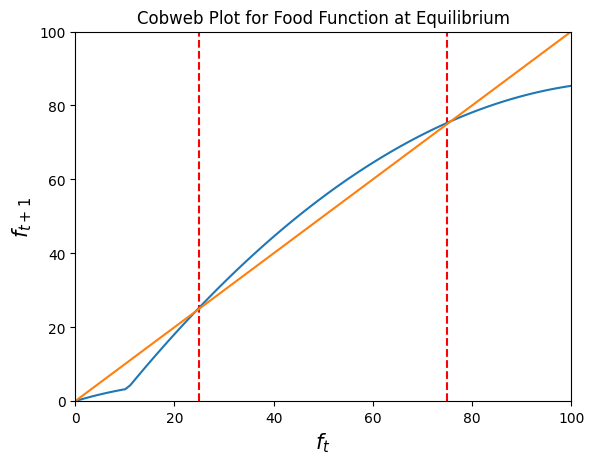

In [12]:
def bt_equation(cb, ft, gb):
    return ft*(1+gb)/cb

def ft_equation(ft, gf, kf, cb, bt, gb):
    return np.maximum(ft * (1 + gf * (1 - ft / kf)) - cb*np.minimum(ft/cb, bt)*(1 + gb) + 0.01, 0)

# Parameters
gf = 0.8
gb = 0.4
kf = 100
cb = 0.7
bt = 15

# COBWEB PLOT
ax = np.linspace(0, 100, 100)

# plt.plot(ax, fsolve(equation, ax, args=(gf, kf, cb, bt, gb)))
plt.axvline(25, color='red', linestyle='--')
plt.axvline(75, color='red', linestyle='--')

plt.ylim(0, 100)
plt.xlim(0, 100)
plt.plot(ax, ft_equation(ax, gf, kf, cb, bt, gb))
plt.plot(ax, ax)
plt.title('Cobweb Plot for Food Function at Equilibrium')
plt.xlabel(r'$f_{t}$', size=15)
plt.ylabel(r'$f_{t+1}$', size=15)
plt.show()

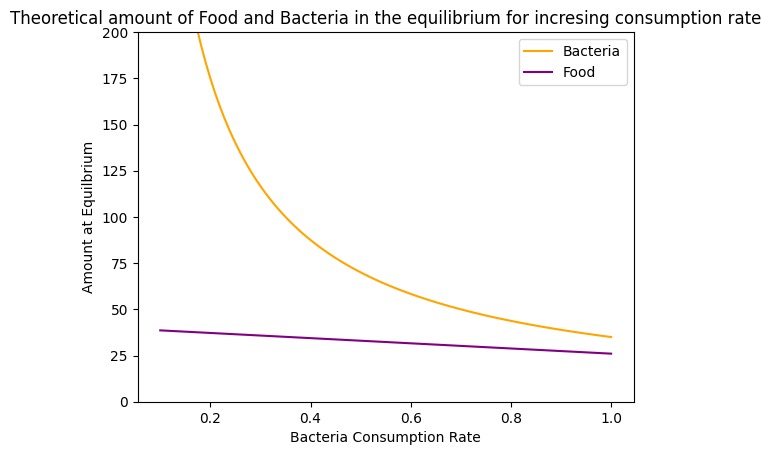

In [5]:
# Parameters
gf = 0.8
gb = 0.4
kf = 100
cb = 0.7
bt = 10
ft = 25

ax = np.linspace(0.1, 1, 100)
plt.plot(ax, bt_equation(ax, ft, gb), label='Bacteria', color='orange')
plt.plot(ax, ft_equation(ft, gf, kf, ax, bt, gb), label='Food', color='purple')
plt.ylim(0, 200)
plt.legend()
plt.title('Theoretical amount of Food and Bacteria in the equilibrium for incresing consumption rate')
plt.xlabel('Bacteria Consumption Rate')
plt.ylabel('Amount at Equilbrium')
plt.show()

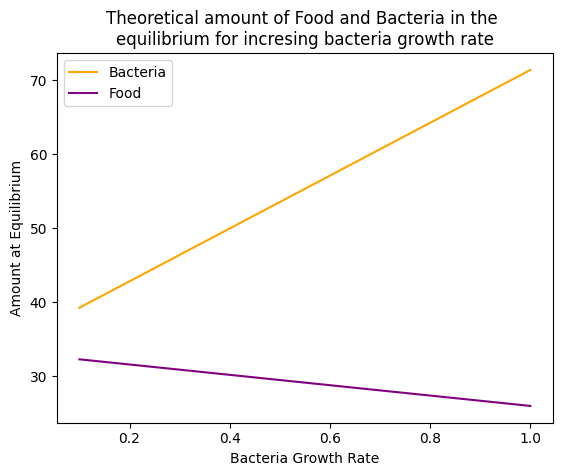

In [6]:
plt.plot(ax, bt_equation(cb, ft, ax), label='Bacteria', color='orange')
plt.plot(ax, ft_equation(ft, gf, kf, cb, bt, ax), label='Food', color='purple')

plt.legend()
plt.title('Theoretical amount of Food and Bacteria in the \nequilibrium for incresing bacteria growth rate')
plt.xlabel('Bacteria Growth Rate')
plt.ylabel('Amount at Equilibrium')
plt.show()

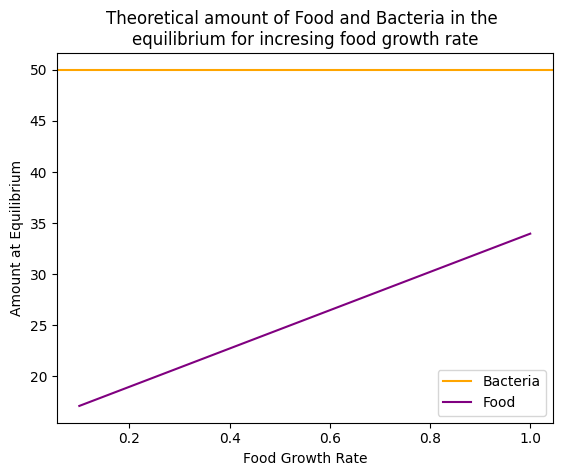

In [7]:
plt.axhline(bt_equation(cb, ft, gb), label='Bacteria', color='orange')
plt.plot(ax, ft_equation(ft, ax, kf, cb, bt, gb), label='Food', color='purple')

plt.legend()
plt.title('Theoretical amount of Food and Bacteria in the \nequilibrium for incresing food growth rate')
plt.xlabel('Food Growth Rate')
plt.ylabel('Amount at Equilibrium')
plt.show()